## Spotify Data and User Preferences

## Imports

In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from pandas_profiling import ProfileReport
from ipywidgets import interact
from IPython.display import display
from ipywidgets import widgets
import plotly.express as px
import plotly.graph_objects as go
from factor_analyzer import FactorAnalyzer
import fitter
from wordcloud import WordCloud

## Read data and Initial Explorations

In [2]:
spotify_data = pd.read_csv('dataset.csv')
spotify_data.drop(columns=spotify_data.columns[0], inplace=True)

In [3]:
spotify_data.head()

,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,73,230666,False,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4,acoustic
1,4qPNDBW1i3p13qLCt0Ki3A,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,False,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4,acoustic
2,1iJBSr7s7jYXzM8EGcbK5b,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,False,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4,acoustic
3,6lfxq3CG4xtTiEg7opyCyx,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,False,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3,acoustic
4,5vjLSffimiIP26QG5WcN2K,Chord Overstreet,Hold On,Hold On,82,198853,False,0.618,0.4430,2,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4,acoustic


In [4]:
len(spotify_data.columns)

20

In [5]:
spotify_data.columns

Index(['track_id', 'artists', 'album_name', 'track_name', 'popularity',
       'duration_ms', 'explicit', 'danceability', 'energy', 'key', 'loudness',
       'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'time_signature', 'track_genre'],
      dtype='object')

In [6]:
spotify_data.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
popularity,114000.0,33.238535,22.305078,0.000,17.00000,35.000000,50.0000,100.000
duration_ms,114000.0,228029.153114,107297.712645,0.000,174066.00000,212906.000000,261506.0000,5237295.000
danceability,114000.0,0.566800,0.173542,0.000,0.45600,0.580000,0.6950,0.985
energy,114000.0,0.641383,0.251529,0.000,0.47200,0.685000,0.8540,1.000
key,114000.0,5.309140,3.559987,0.000,2.00000,5.000000,8.0000,11.000
loudness,114000.0,-8.258960,5.029337,-49.531,-10.01300,-7.004000,-5.0030,4.532
mode,114000.0,0.637553,0.480709,0.000,0.00000,1.000000,1.0000,1.000
speechiness,114000.0,0.084652,0.105732,0.000,0.03590,0.048900,0.0845,0.965
acousticness,114000.0,0.314910,0.332523,0.000,0.01690,0.169000,0.5980,0.996
instrumentalness,114000.0,0.156050,0.309555,0.000,0.00000,0.000042,0.0490,1.000


In [7]:
spotify_data.track_genre.unique()

array(['acoustic', 'afrobeat', 'alt-rock', 'alternative', 'ambient',
       'anime', 'black-metal', 'bluegrass', 'blues', 'brazil',
       'breakbeat', 'british', 'cantopop', 'chicago-house', 'children',
       'chill', 'classical', 'club', 'comedy', 'country', 'dance',
       'dancehall', 'death-metal', 'deep-house', 'detroit-techno',
       'disco', 'disney', 'drum-and-bass', 'dub', 'dubstep', 'edm',
       'electro', 'electronic', 'emo', 'folk', 'forro', 'french', 'funk',
       'garage', 'german', 'gospel', 'goth', 'grindcore', 'groove',
       'grunge', 'guitar', 'happy', 'hard-rock', 'hardcore', 'hardstyle',
       'heavy-metal', 'hip-hop', 'honky-tonk', 'house', 'idm', 'indian',
       'indie-pop', 'indie', 'industrial', 'iranian', 'j-dance', 'j-idol',
       'j-pop', 'j-rock', 'jazz', 'k-pop', 'kids', 'latin', 'latino',
       'malay', 'mandopop', 'metal', 'metalcore', 'minimal-techno', 'mpb',
       'new-age', 'opera', 'pagode', 'party', 'piano', 'pop-film', 'pop',
       'pow

Text(0.5, 1.0, 'Correlation between Variables')

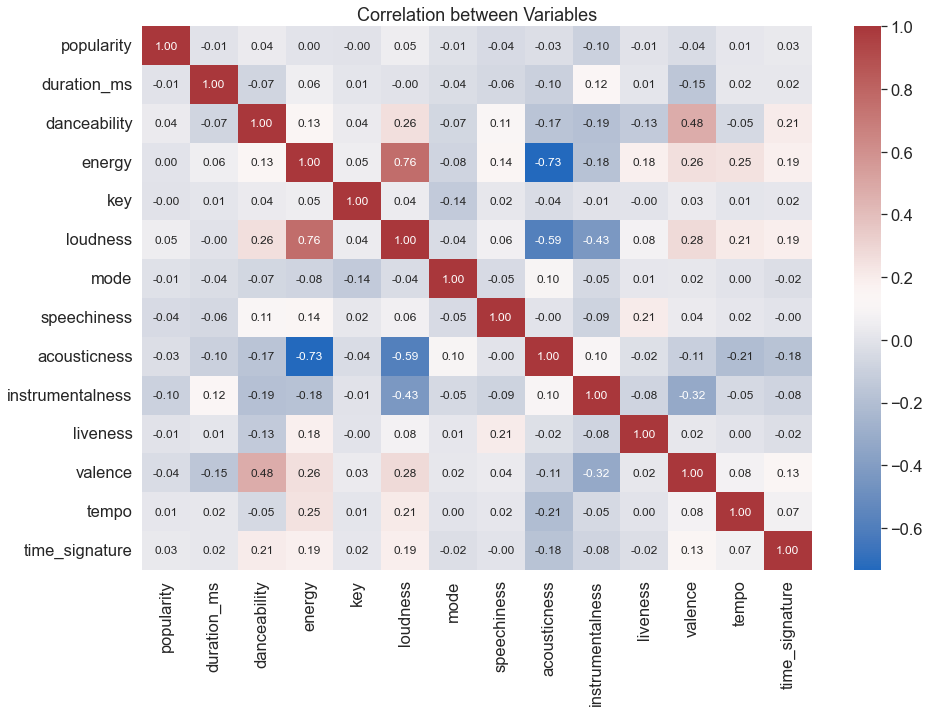

In [8]:
numerics_data = spotify_data.drop(columns=['track_id', 'artists', 'album_name', 'track_name','explicit', 'track_genre' ])
plt.figure(figsize=(15, 10))
sns.set(font_scale=1.5)
sns.heatmap(numerics_data.corr(), cmap='vlag', annot=True, fmt=".2f",annot_kws={"size": 12})
plt.title("Correlation between Variables")

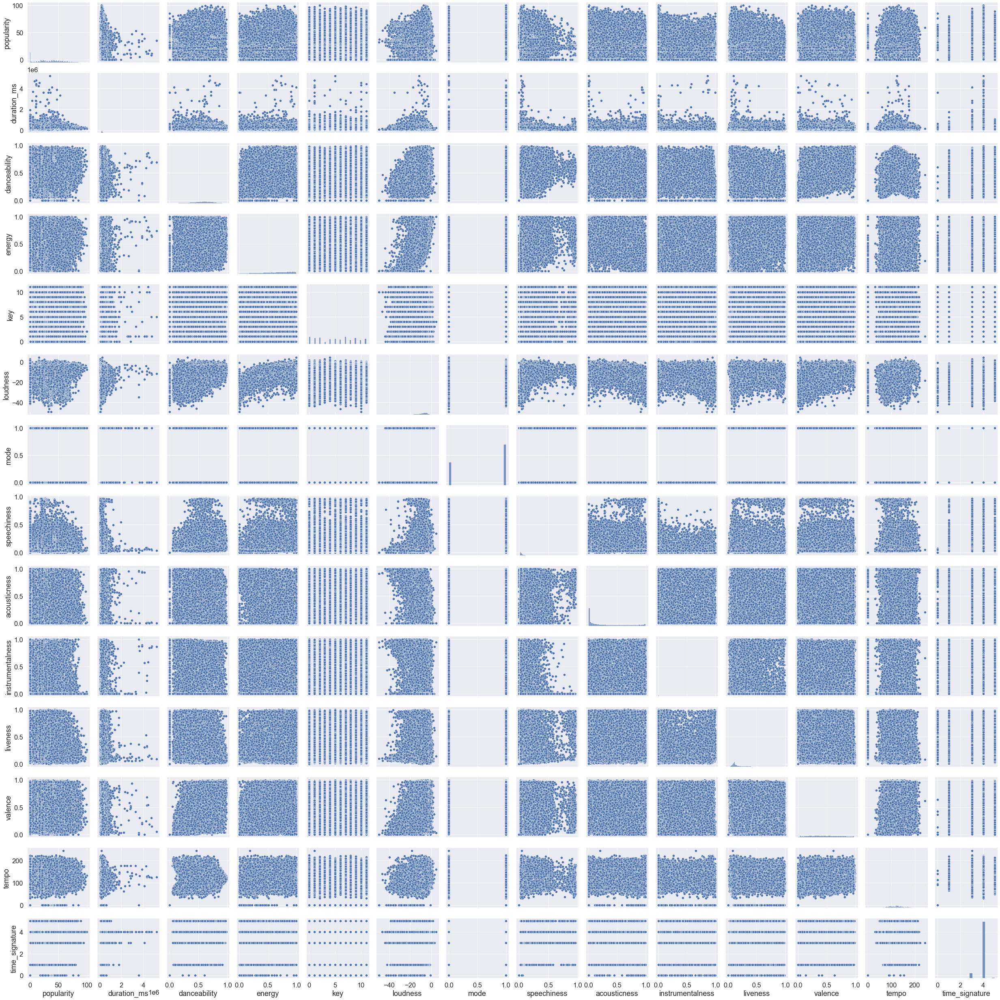

In [9]:
fig = sns.pairplot(numerics_data)

## KDE plot on track attributes:

### Popularity

Text(0.5, 1.0, 'Popularity Distribution of all Tracks')

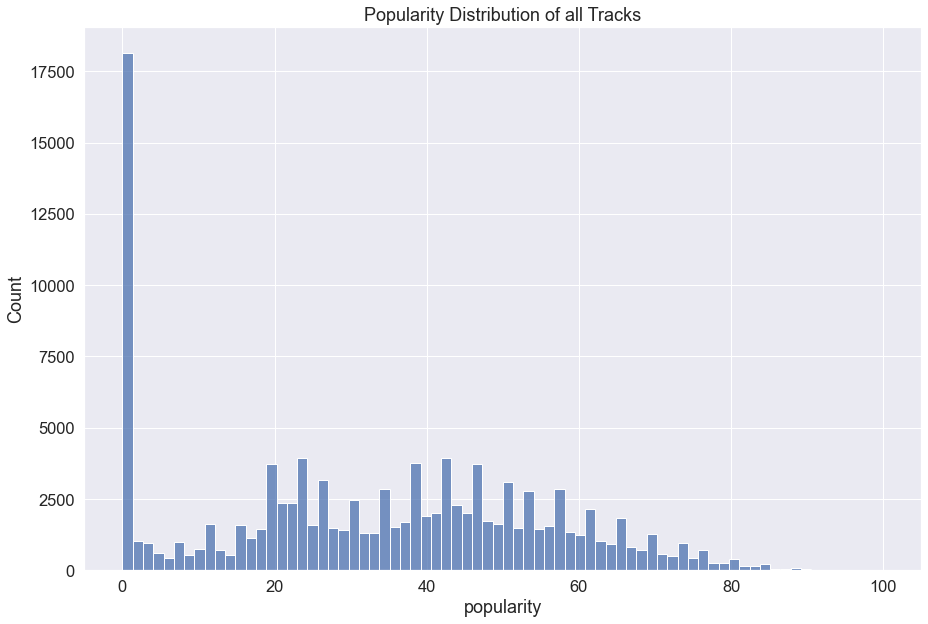

In [10]:
plt.figure(figsize=(15, 10))
sns.histplot(data=spotify_data, x='popularity')
plt.title("Popularity Distribution of all Tracks")

In [11]:
spotify_data.groupby('track_genre')['popularity'].mean()

track_genre
acoustic       42.483
afrobeat       24.399
alt-rock       33.943
alternative    24.337
ambient        44.191
                ...  
techno         39.042
trance         37.635
trip-hop       34.460
turkish        40.698
world-music    41.873
Name: popularity, Length: 114, dtype: float64

(-0.5, 1279.5, 719.5, -0.5)

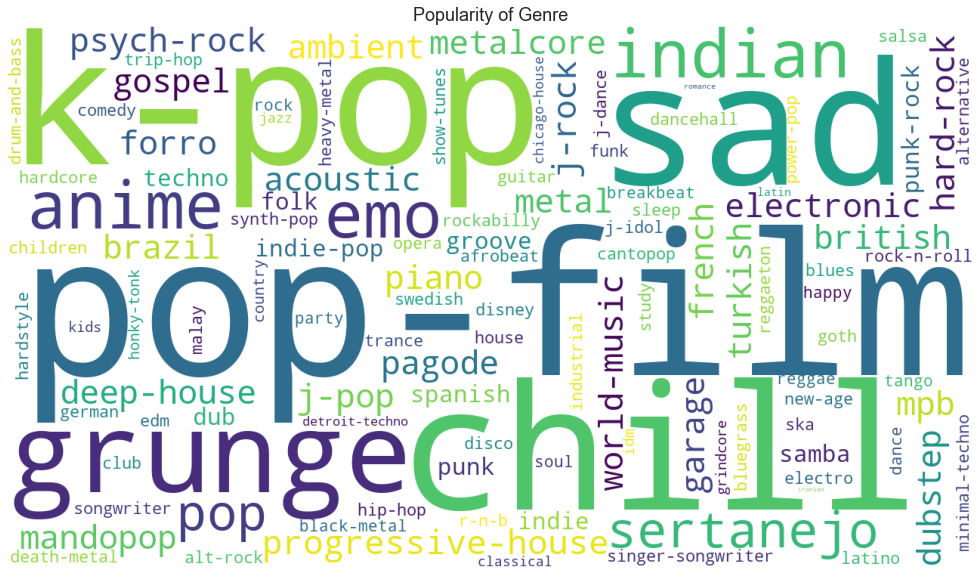

In [12]:
plt.figure(figsize=(20, 10))
wc1 = WordCloud(
background_color='white', width=1280, height=720)
img = wc1.generate_from_frequencies(spotify_data.groupby('track_genre')['popularity'].mean())
plt.imshow(img)
plt.title("Popularity of Genre")
plt.grid(False)
plt.axis('off')

Text(0.5, 1.0, 'Least 10 Popular Genre')

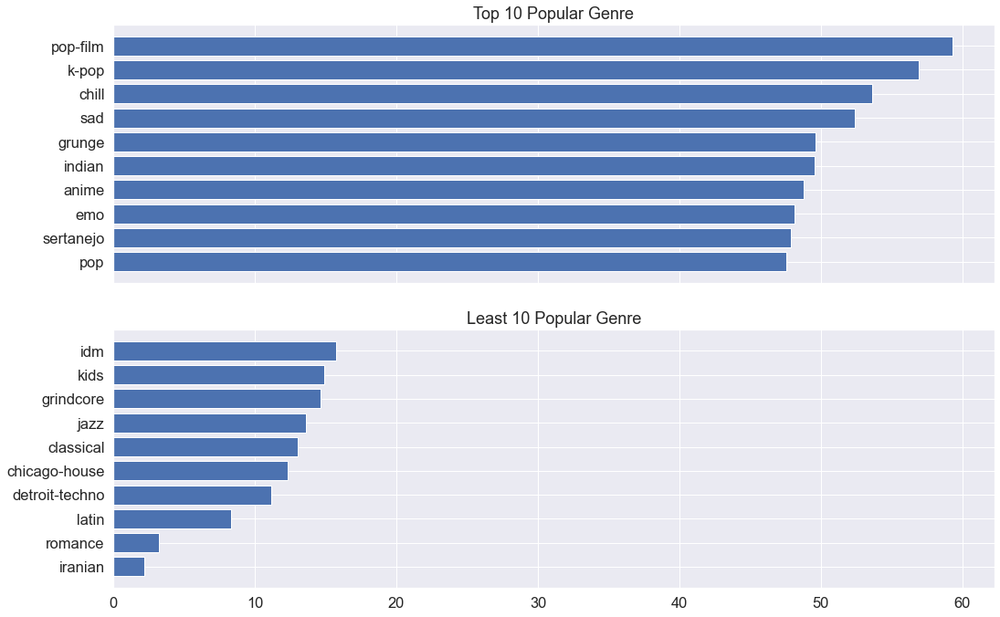

In [13]:
fig, ax = plt.subplots(2, 1, figsize=(15, 10), sharex=True)
spotify_data_pop_mean = spotify_data.groupby('track_genre')['popularity'].agg(['mean']).sort_values(by='mean', ascending = True)
plt.tight_layout(pad=2)
ax[0].barh(data=spotify_data_pop_mean.tail(10), width='mean', y=spotify_data_pop_mean.tail(10).index)
ax[0].set_title("Top 10 Popular Genre")
ax[1].barh(data=spotify_data_pop_mean.head(10), width='mean', y=spotify_data_pop_mean.head(10).index)
ax[1].set_title("Least 10 Popular Genre")

In [14]:
def pop_by_genre(genre):
    plt.figure(figsize=(20, 10))
    condition = (spotify_data['track_genre'] == genre)
    sns.histplot(spotify_data[condition]['popularity'], kde=True, binwidth=5, bins=25)
    plt.xlim([0, 100])
    plt.title('KDE plot of Popularity Distribution of Genre {}'.format(genre))
interact(pop_by_genre, genre = spotify_data['track_genre'].unique())

interactive(children=(Dropdown(description='genre', options=('acoustic', 'afrobeat', 'alt-rock', 'alternative'…

<function __main__.pop_by_genre(genre)>

Text(0.5, 1.0, 'KDE Plot')

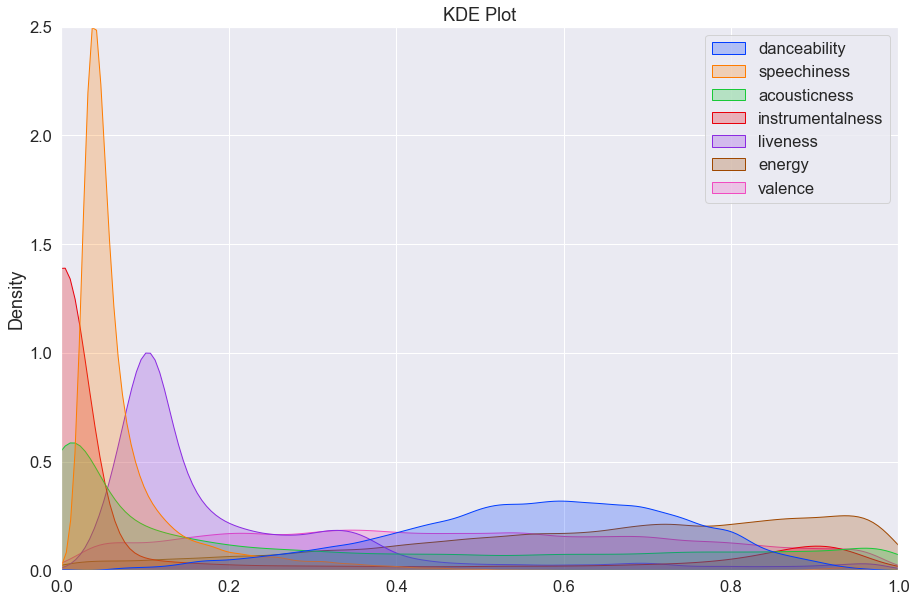

In [15]:
plt.figure(figsize=(15, 10))
sns.kdeplot(data=spotify_data[
    ['danceability','speechiness', 'acousticness', 'instrumentalness', 'liveness', 'energy','valence']
], shade=True, palette="bright")
plt.xlim([0, 1])
plt.ylim([0, 2.5])
plt.title("KDE Plot")

In [16]:
def kde_metrics(genre):
    condition = (spotify_data['track_genre'] ==  genre)
    plt.figure(figsize=(15, 10))
    sns.kdeplot(data=spotify_data[condition][
        ['danceability','speechiness', 'acousticness', 'instrumentalness', 'liveness', 'energy','valence']
    ], shade=True, palette='bright')
    plt.xlim([0, 1])
    plt.title("KDE Plot for the genre {}".format(genre))
interact(kde_metrics, genre=spotify_data['track_genre'].unique())

interactive(children=(Dropdown(description='genre', options=('acoustic', 'afrobeat', 'alt-rock', 'alternative'…

<function __main__.kde_metrics(genre)>

In [17]:
def kde_loudness(genre):
    fig = plt.figure(figsize=(15, 10))
    condition = (spotify_data['track_genre'] ==  genre)
    sns.histplot(data=spotify_data[condition]['loudness'], kde=True)
    plt.xlim([-60, 0])
    plt.ylim([0, 140])
    plt.xlabel("Loudness (Measured in dB)")
    plt.title("Histogram of Loudness for Genre: {}".format(genre))

interact(kde_loudness, genre=spotify_data['track_genre'].unique())

interactive(children=(Dropdown(description='genre', options=('acoustic', 'afrobeat', 'alt-rock', 'alternative'…

<function __main__.kde_loudness(genre)>

<AxesSubplot:xlabel='danceability', ylabel='Count'>

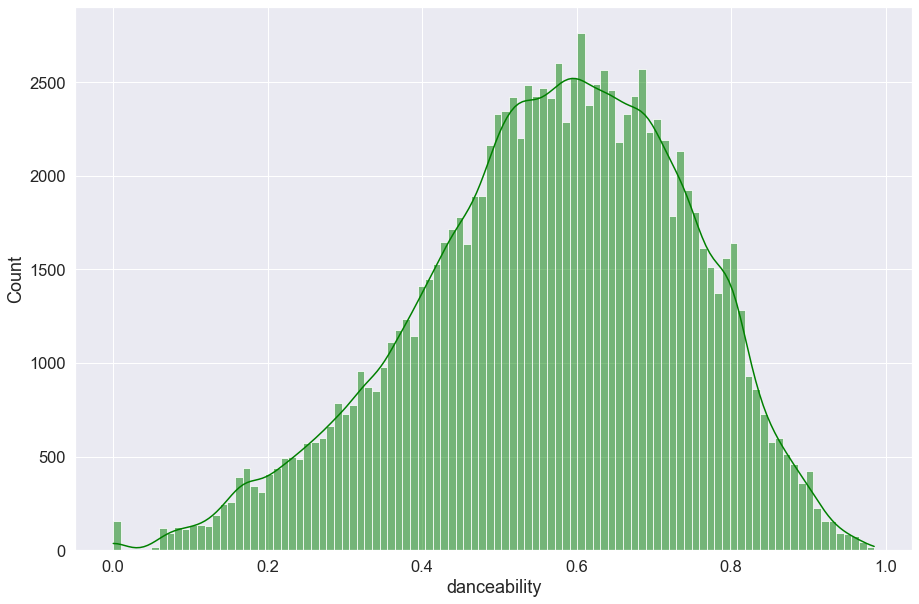

In [18]:
plt.figure(figsize=(15, 10))
sns.histplot(data=spotify_data['danceability'], kde=True, color="green")

## Scatter Plots of 2 Variables

In [19]:
def create_scatter(feature1, feature2, genre):
    with plt.style.context('ggplot'):
        plt.close('all')
        fig = plt.figure(figsize=(20, 10))
        plt.scatter(data=spotify_data[spotify_data['track_genre'] == genre], x=feature1, y=feature2, c='blue')
        b, a = np.polyfit(spotify_data[spotify_data['track_genre'] == genre][feature1], 
                   spotify_data[spotify_data['track_genre'] == genre][feature2], deg=1)
        xseq = np.linspace(spotify_data[spotify_data['track_genre'] == genre][feature1].min(), 
                           spotify_data[spotify_data['track_genre'] == genre][feature1].max(), num=100)
        plt.plot(xseq, a + b * xseq, color="k", lw=2.5);
        plt.xlabel(feature1.capitalize())
        plt.ylabel(feature2.capitalize())
        plt.title("{} vs {} of Genre {}".format(feature1.capitalize(), feature2.capitalize(), genre.capitalize()))
        
feature1_dropdown = widgets.Dropdown(options=numerics_data.columns, value=numerics_data.columns[0], description="X-axis")
feature2_dropdown = widgets.Dropdown(options=numerics_data.columns, value=numerics_data.columns[1], description="Y-axis")
genre_dropdown = widgets.Dropdown(
    options=spotify_data['track_genre'].unique(), 
    value=spotify_data['track_genre'].unique()[0],
    description="Genre"
)

In [20]:
output = widgets.interactive_output(create_scatter, {
    'feature1': feature1_dropdown,
    'feature2': feature2_dropdown,
    'genre': genre_dropdown
})


In [21]:
widgets.VBox([widgets.HBox([feature1_dropdown, feature2_dropdown, genre_dropdown]), output])

## Duration of Song By Genre

In [22]:
barplot = spotify_data.groupby('track_genre')['duration_ms'].agg(['mean', 'std']).sort_values(by='mean', ascending=False)

Text(0.5, 1.0, 'Duration across Genre')

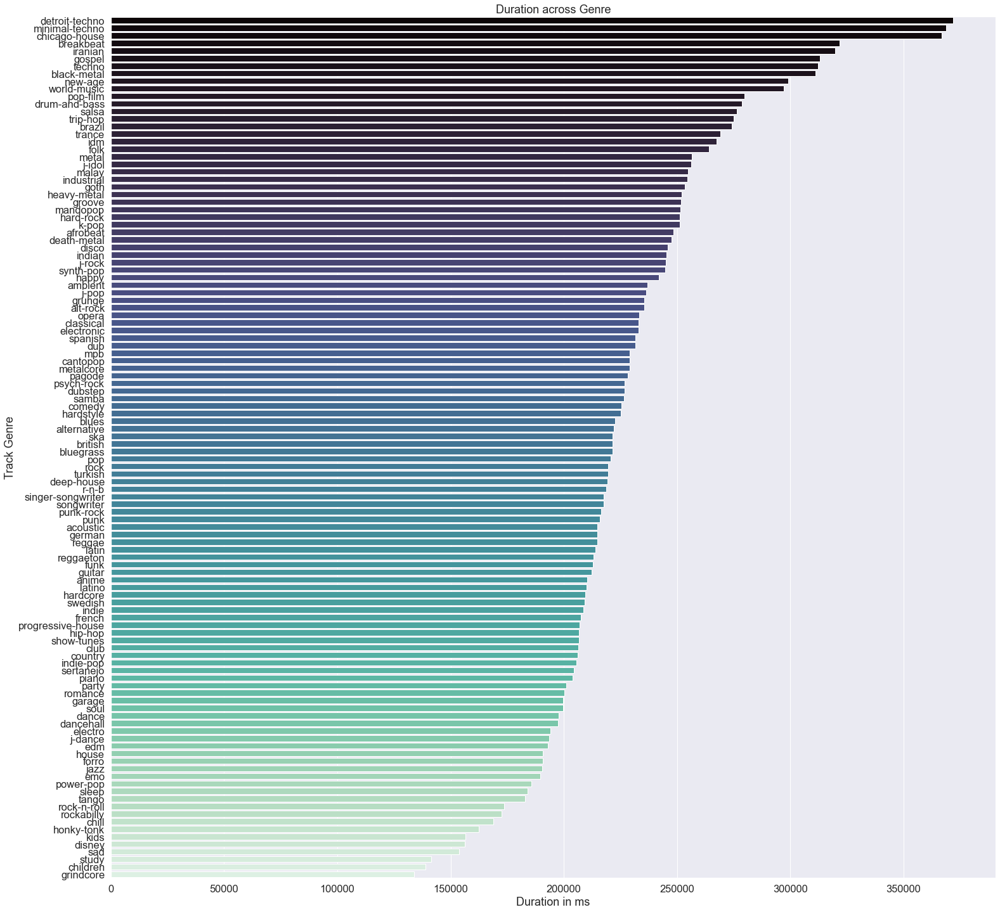

In [23]:
plt.figure(figsize=(25, 25))
sns.barplot(x='mean', y=barplot.index, data=barplot, palette="mako")
plt.xlabel("Duration in ms")
plt.ylabel("Track Genre")
plt.title('Duration across Genre')

## Top 10 Tracks of Genre by Popularity

In [24]:
genres = list(spotify_data['track_genre'].unique())
def genre_table(genre):
    result = spotify_data[spotify_data['track_genre'] == genre]\
        .sort_values(by='popularity', ascending=False).head(30)[['track_name', 'artists', 'popularity']]
    plt.figure(figsize=(20, 10))
    plt.bar(height=result.popularity, x=result.track_name)
    plt.title("Top 30 Tracks of {}".format(genre))
    plt.xticks(rotation=90)
interact(genre_table, genre = genres)

interactive(children=(Dropdown(description='genre', options=('acoustic', 'afrobeat', 'alt-rock', 'alternative'…

<function __main__.genre_table(genre)>

## Total Number of Tracks by Artist

In [25]:
song_by_artist = spotify_data.groupby('artists')['popularity'].agg(['mean']).sort_values(by='mean', ascending=False)

In [26]:
song_by_artist

,mean
artists,
Sam Smith;Kim Petras,100.0
Bizarrap;Quevedo,99.0
Manuel Turizo,98.0
Bad Bunny;Chencho Corleone,97.0
Bad Bunny;Bomba Estéreo,94.5
...,...
Pyotr Ilyich Tchaikovsky;Martha Argerich;Nicolas Economou,0.0
Pyotr Ilyich Tchaikovsky;Los Angeles Philharmonic;Gustavo Dudamel,0.0
Kenny Chesney;Mindy Smith,0.0


In [27]:
top_slider = widgets.IntSlider(
    value=10,
    min=10,
    max=100,
    step=10,
    description='Top:',
    disabled=False,
    continuous_update=False,
    orientation='horizontal',
    readout=True,
    readout_format='d'
)

In [28]:
def plot_top_num_of_tracks(Top):
    plt.figure(figsize=(Top/2, 10))
    # plt.barh(data=song_by_artist.head(top_num), y=song_by_artist.head(top_num).index, width='count')
    plt.bar(data=song_by_artist.head(Top), height='mean', x=song_by_artist.head(Top).index)
    plt.xticks(rotation=90)
    plt.title("Top {} Artist by Popularity".format(Top))

In [29]:
output = widgets.interactive_output(plot_top_num_of_tracks, {
    "Top": top_slider
})
widgets.VBox([top_slider,output])

In [30]:
from wordcloud import WordCloud
def wordCloud_genre(genre):
    fig = plt.figure(figsize=(20, 10))
    wc = WordCloud(width=720, height=480, background_color='white', colormap='crest')
    img = wc.generate_from_frequencies(spotify_data[spotify_data['track_genre'] == genre].groupby('artists')['popularity'].agg('mean'))
    plt.imshow(img)
    plt.grid(False)
    plt.axis('off')
    
interact(wordCloud_genre, genre=spotify_data.track_genre.unique())


interactive(children=(Dropdown(description='genre', options=('acoustic', 'afrobeat', 'alt-rock', 'alternative'…

<function __main__.wordCloud_genre(genre)>

## Cluster Analysis on Songs

In [31]:
len(spotify_data.columns)

20

In [32]:
spotify_data.drop(columns=['track_id', 'artists', 'album_name', 'track_name', 'time_signature', 'track_genre', 'explicit', 'mode'])

,popularity,duration_ms,danceability,energy,key,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo
0,73,230666,0.676,0.4610,1,-6.746,0.1430,0.0322,0.000001,0.3580,0.7150,87.917
1,55,149610,0.420,0.1660,1,-17.235,0.0763,0.9240,0.000006,0.1010,0.2670,77.489
2,57,210826,0.438,0.3590,0,-9.734,0.0557,0.2100,0.000000,0.1170,0.1200,76.332
3,71,201933,0.266,0.0596,0,-18.515,0.0363,0.9050,0.000071,0.1320,0.1430,181.740
4,82,198853,0.618,0.4430,2,-9.681,0.0526,0.4690,0.000000,0.0829,0.1670,119.949
...,...,...,...,...,...,...,...,...,...,...,...,...
113995,21,384999,0.172,0.2350,5,-16.393,0.0422,0.6400,0.928000,0.0863,0.0339,125.995
113996,22,385000,0.174,0.1170,0,-18.318,0.0401,0.9940,0.976000,0.1050,0.0350,85.239
113997,22,271466,0.629,0.3290,0,-10.895,0.0420,0.8670,0.000000,0.0839,0.7430,132.378
113998,41,283893,0.587,0.5060,7,-10.889,0.0297,0.3810,0.000000,0.2700,0.4130,135.960


In [35]:
from sklearn.decomposition import PCA 

pca = PCA(n_components=1)
pca.fit_transform(spotify_data[['energy','loudness', 'acousticness']])
pca.explained_variance_ratio_

array([0.9961344])

In [55]:
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.metrics import silhouette_score
from sklearn.model_selection import ParameterGrid
from sklearn.preprocessing import StandardScaler, MinMaxScaler

X = spotify_data.drop(columns=['track_id', 'artists', 'album_name', 'track_name', 'time_signature', 'track_genre',
                               'explicit', 'key','mode', 'energy','loudness', 'acousticness']).copy()

X['duration_ms'] = StandardScaler().fit_transform(X[["duration_ms"]])
X['popularity'] = MinMaxScaler().fit_transform(X[['popularity']])
X['tempo'] = StandardScaler().fit_transform(X[['tempo']])
X['energy_loudness_acoustiness'] = pca.fit_transform(spotify_data[['energy','loudness', 'acousticness']])

X_scaled = X

# # Arrays are for assesment later: Within Cluster Sum-of-squaresd and Silhouette Score
wcss = []
for num_cluster in range(2, 50):
    kmean_model = KMeans(n_clusters=num_cluster, n_init='auto', verbose=0)
    kmean_model.fit(X_scaled)
    wcss.append(kmean_model.inertia_)
    # ss.append(silhouette_score(X_scaled, kmean_model.labels_))

Text(0.5, 1.0, 'Elbow Method')

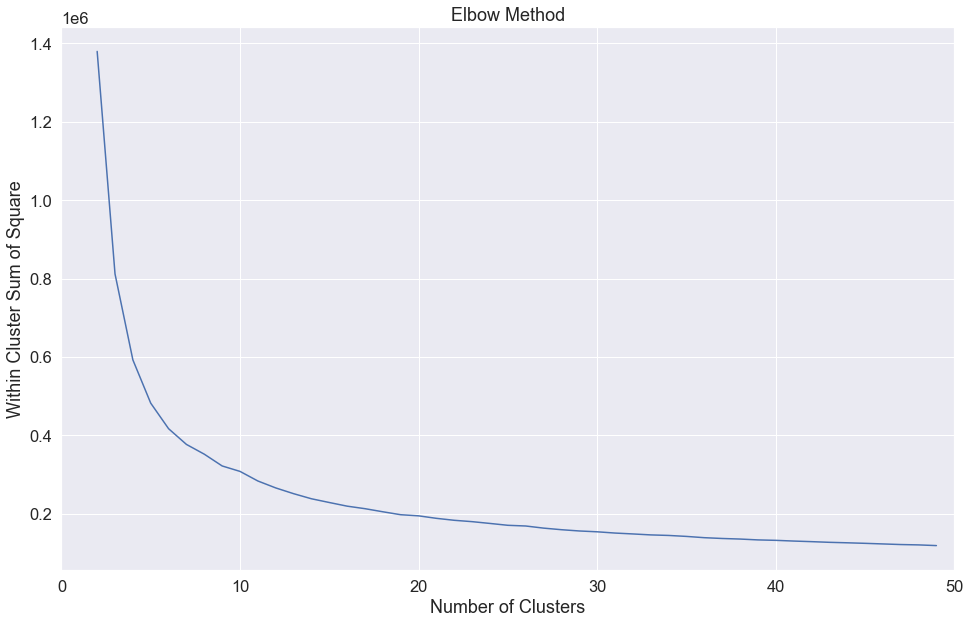

In [56]:
plt.figure(figsize=(16, 10))
plt.plot(range(2, 50), wcss)
plt.xlim([0, 50])
plt.xlabel("Number of Clusters")
plt.ylabel("Within Cluster Sum of Square")
plt.title("Elbow Method")

In [57]:
kmean_model_final = KMeans(n_clusters=6, n_init='auto', random_state=0, verbose=2)
kmean_model_final.fit(X_scaled)
kmean_model_final.inertia_
# print(silhouette_score(X, kmean_model_final.labels_))

Initialization complete
Iteration 0, inertia 650177.6580906986.
Iteration 1, inertia 465371.87198886694.
Iteration 2, inertia 437974.5758992393.
Iteration 3, inertia 427835.3679448778.
Iteration 4, inertia 423455.56233619596.
Iteration 5, inertia 421044.8221766221.
Iteration 6, inertia 419640.585624967.
Iteration 7, inertia 418728.7341724167.
Iteration 8, inertia 418156.6918815514.
Iteration 9, inertia 417763.5826760583.
Iteration 10, inertia 417495.04167349456.
Iteration 11, inertia 417294.472418596.
Iteration 12, inertia 417188.5897898765.
Iteration 13, inertia 417133.0135228617.
Iteration 14, inertia 417104.63139829074.
Iteration 15, inertia 417085.2408972365.
Iteration 16, inertia 417073.02558531193.
Converged at iteration 16: center shift 0.00015590342658828915 within tolerance 0.0003073302533930717.


417066.17679582234

In [58]:
cluster_centers = pd.DataFrame(
    kmean_model_final.cluster_centers_, 
    columns=kmean_model_final.feature_names_in_, 
    index=["Cluster {}".format(k) for k in range(6)]
)

In [59]:
cluster_centers

,popularity,duration_ms,danceability,speechiness,instrumentalness,liveness,valence,tempo,energy_loudness_acoustiness
Cluster 0,0.341278,0.011698,0.592520,0.082957,0.093683,0.220847,0.508393,0.026984,-1.888592
Cluster 1,0.258656,-0.002225,0.406150,0.078605,0.552900,0.194881,0.253094,-0.508722,11.285483
Cluster 2,0.343399,0.109264,0.587222,0.077578,0.159828,0.204055,0.471812,-0.090705,1.086614
Cluster 3,0.312658,-0.010229,0.552625,0.084346,0.243837,0.191929,0.414674,-0.201905,5.058555
Cluster 4,0.334089,-0.089302,0.571945,0.096381,0.072206,0.229603,0.523234,0.284938,-4.497988
Cluster 5,0.335402,-0.227407,0.294317,0.054803,0.792965,0.165602,0.162786,-0.722056,20.972775


In [60]:
spotify_data_with_cluster = spotify_data.copy()

spotify_data_with_cluster['Cluster ID'] = kmean_model_final.predict(X_scaled)

In [61]:
spotify_data_with_cluster[
    ['duration_ms', 'danceability', 'speechiness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'energy', 'loudness',
    'acousticness', 'Cluster ID']
]

,duration_ms,danceability,speechiness,instrumentalness,liveness,valence,tempo,energy,loudness,acousticness,Cluster ID
0,230666,0.676,0.1430,0.000001,0.3580,0.7150,87.917,0.4610,-6.746,0.0322,0
1,149610,0.420,0.0763,0.000006,0.1010,0.2670,77.489,0.1660,-17.235,0.9240,1
2,210826,0.438,0.0557,0.000000,0.1170,0.1200,76.332,0.3590,-9.734,0.2100,2
3,201933,0.266,0.0363,0.000071,0.1320,0.1430,181.740,0.0596,-18.515,0.9050,1
4,198853,0.618,0.0526,0.000000,0.0829,0.1670,119.949,0.4430,-9.681,0.4690,2
...,...,...,...,...,...,...,...,...,...,...,...
113995,384999,0.172,0.0422,0.928000,0.0863,0.0339,125.995,0.2350,-16.393,0.6400,3
113996,385000,0.174,0.0401,0.976000,0.1050,0.0350,85.239,0.1170,-18.318,0.9940,1
113997,271466,0.629,0.0420,0.000000,0.0839,0.7430,132.378,0.3290,-10.895,0.8670,2
113998,283893,0.587,0.0297,0.000000,0.2700,0.4130,135.960,0.5060,-10.889,0.3810,2


In [62]:
spotify_data_with_cluster.groupby('Cluster ID').agg(['count'])['track_name']

,count
Cluster ID,
0,37289
1,5450
2,25803
3,13773
4,29591
5,2093


In [63]:
spotify_data_with_cluster[spotify_data_with_cluster['Cluster ID'] == 2][
    ['danceability', 'speechiness', 'instrumentalness', 'liveness', 'valence', 'energy', 'acousticness']
].mean()

danceability        0.587293
speechiness         0.077546
instrumentalness    0.159812
liveness            0.204090
valence             0.471806
energy              0.556667
acousticness        0.384872
dtype: float64

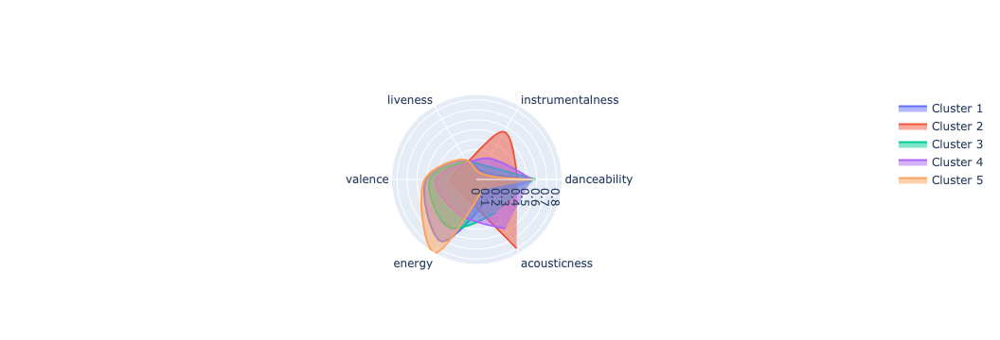

In [64]:
from plotly.subplots import make_subplots

fig = go.Figure()
for i in range(5):
    fig.add_trace(
        go.Scatterpolar(theta=['danceability', 'instrumentalness', 'liveness', 'valence', 'energy', 'acousticness'], 
              r=spotify_data_with_cluster[spotify_data_with_cluster['Cluster ID'] == i][
            ['danceability', 'instrumentalness', 'liveness', 'valence', 'energy', 'acousticness']
        ].mean(),line_shape='spline', mode='lines', fill='toself', name="Cluster {}".format(i + 1))
    )

fig.show()

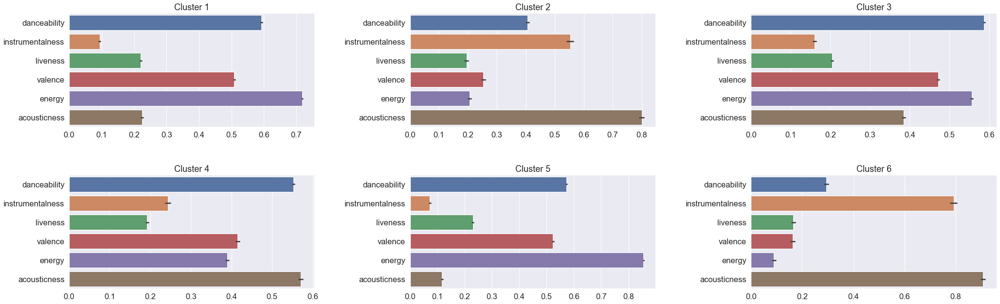

In [65]:
fig, ax = plt.subplots(2,3,figsize=(30, 10))
sns.set(font_scale=1.5)
for i in range(6):
    q, mod = divmod(i, 3)
    plt.tight_layout(pad=3)
    g = sns.barplot(
        data=spotify_data_with_cluster[spotify_data_with_cluster['Cluster ID'] == i][
            ['danceability', 'instrumentalness', 'liveness', 'valence', 'energy', 'acousticness']
        ],
        orient='h',
        ax=ax[q][mod]
    )
    # g.set(xlim=(0, None))
    ax[q][mod].set_title("Cluster {}".format(i+1))

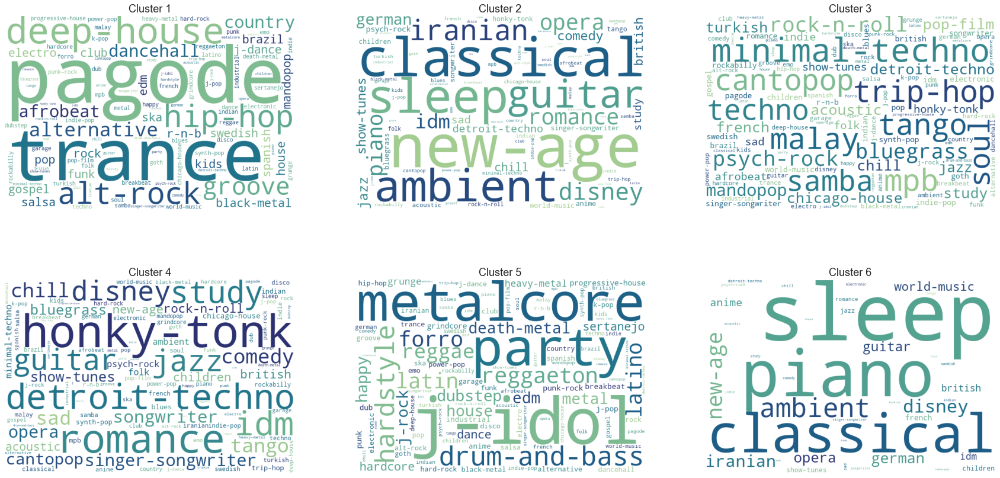

In [66]:
from wordcloud import WordCloud

fig, ax = plt.subplots(2, 3, figsize=(30, 15))
for i in range(6):
    q, mod = divmod(i, 3)
    wc = WordCloud(width=720, height=480, background_color='white', colormap='crest')
    img = wc.generate_from_frequencies(spotify_data_with_cluster[spotify_data_with_cluster['Cluster ID'] ==i]['track_genre'].value_counts())
    ax[q][mod].imshow(img)
    ax[q][mod].grid(False)
    ax[q][mod].axis('off')
    ax[q][mod].set_title("Cluster {}".format(i+1))


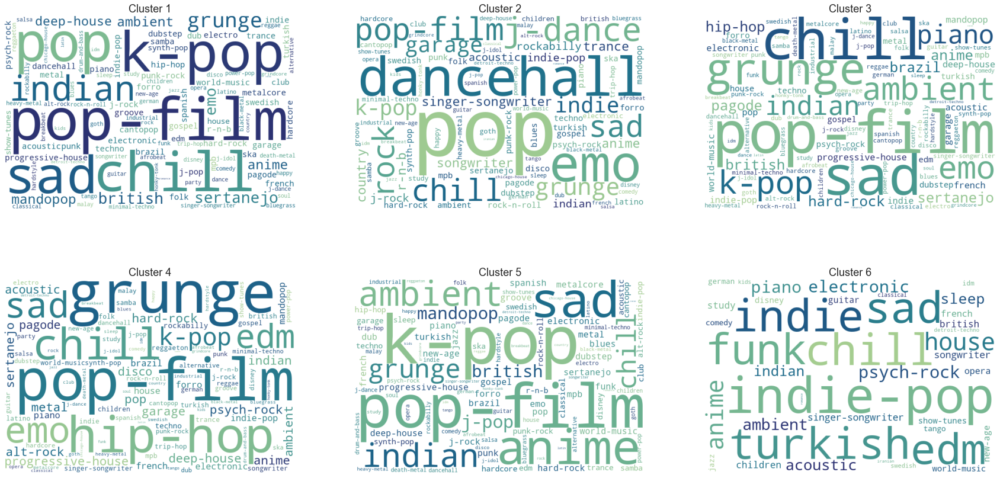

In [67]:
from wordcloud import WordCloud

fig, ax = plt.subplots(2, 3, figsize=(30, 15))
for i in range(6):
    q, mod = divmod(i, 3)
    wc = WordCloud(width=720, height=480, background_color='white', colormap='crest')
    img = wc.generate_from_frequencies(spotify_data_with_cluster[spotify_data_with_cluster['Cluster ID'] ==i].groupby(['track_genre'])['popularity'].agg('mean'))
    ax[q][mod].imshow(img)
    ax[q][mod].grid(False)
    ax[q][mod].axis('off')
    ax[q][mod].set_title("Cluster {}".format(i+1))

In [68]:
spotify_data_with_cluster[spotify_data_with_cluster['Cluster ID'] ==2]['track_genre'].value_counts()

minimal-techno    533
mpb               448
trip-hop          442
tango             426
malay             425
                 ... 
sleep              49
j-idol             37
hardstyle          36
party              34
metalcore          30
Name: track_genre, Length: 114, dtype: int64

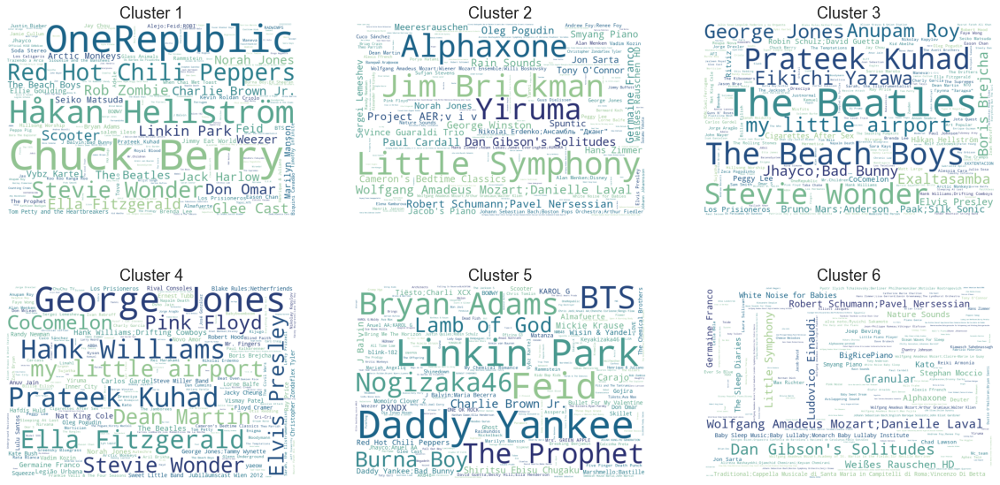

In [69]:
fig, ax = plt.subplots(2, 3, figsize=(20, 10))
for i in range(6):
    q, mod = divmod(i, 3)
    wc = WordCloud(width=720, height=480, background_color='white', colormap='crest')
    img = wc.generate_from_frequencies(spotify_data_with_cluster[spotify_data_with_cluster['Cluster ID'] ==i]['artists'].value_counts())
    ax[q, mod].imshow(img)
    ax[q, mod].grid(False)
    ax[q, mod].axis('off')
    ax[q, mod].set_title("Cluster {}".format(i+1))

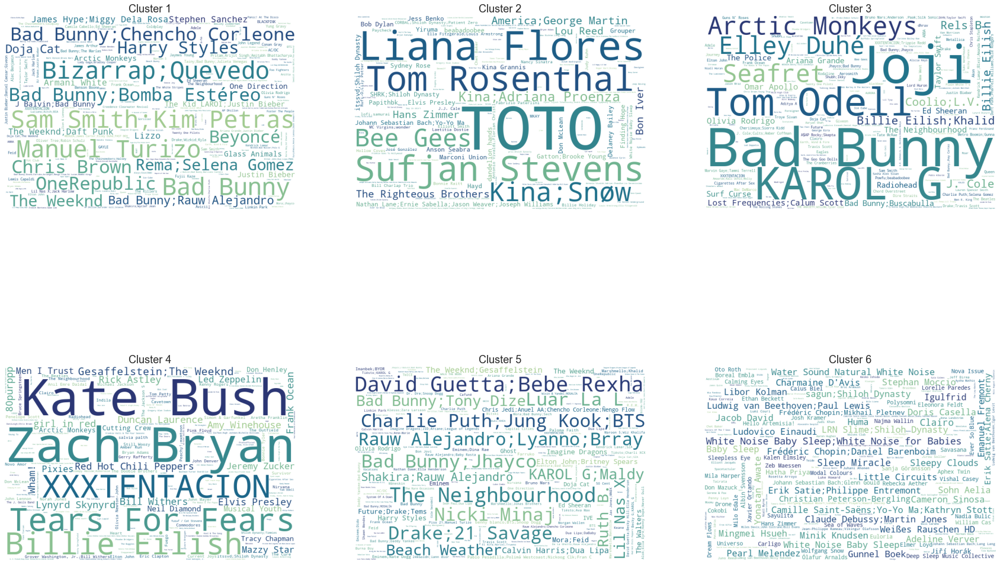

In [70]:
fig, ax = plt.subplots(2, 3, figsize=(30, 20))
for i in range(6):
    q, mod = divmod(i, 3)
    wc = WordCloud(width=720, height=480, background_color='white', colormap='crest')
    img = wc.generate_from_frequencies(spotify_data_with_cluster[spotify_data_with_cluster['Cluster ID'] ==i].groupby('artists')['popularity'].agg('max'))
    ax[q, mod].imshow(img)
    ax[q, mod].grid(False)
    ax[q, mod].axis('off')
    ax[q, mod].set_title("Cluster {}".format(i+1))